# **Train U-Net++ on the HR Global Landslide Detection Dataset**

In [1]:
!pip install segmentation_models rasterio geopandas contextily # This line will install the packages/libraries which are not present in Google Colab. Remember that once the session runtime is over, you need to run this cell as well as the one above again.

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 4.2 MB/s eta 0:00:00


In [2]:
!pip install -U -q segmentation-models
!pip install -q tensorflow
!pip install -q keras

import os
os.environ["SM_FRAMEWORK"] = "tf.keras"

from tensorflow import keras
import segmentation_models as sm

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.8.1 requires wurlitzer, which is not installed.


2024-04-30 17:07:14.923909: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-30 17:07:14.924035: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-30 17:07:15.045670: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Segmentation Models: using `tf.keras` framework.


In [3]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.python.keras import layers
from tensorflow import keras
import pandas as pd
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda,Activation, add
from keras.models import Model
from keras.optimizers import Adam

import sys
sys.path.append('project/Project')

# Library with segmentation metrics
import segmentation_models as sm

physical_devices = tf.config.experimental.list_physical_devices('GPU')

for device in physical_devices:
    tf.config.experimental.set_memory_growth(device, True)

if tf.test.gpu_device_name():

    print('Default GPU Device:{}'.format(tf.test.gpu_device_name()))
else:
   print("Please install GPU version of TF")

Default GPU Device:/device:GPU:0


## Load the NumPy arrays which contains the training, validation, and testing data

### What is an array?
Arrays are a fundamental data structure, and an important part of most programming languages. In Python, they are containers which are able to store more than one item at the same time. Specifically, they are an ordered collection of elements with every value being of the same data type.

#### The images are already cut into 128x128 patch sizes.

![image.png](https://www.researchgate.net/publication/327941585/figure/fig3/AS:686047130296330@1540577790472/The-architecture-of-the-patch-wise-convolutional-network-This-paper-splits-the-large_W640.jpg)

In [4]:
X_train = np.load(f'../Data/Arrays/trainX.npy')
Y_train = np.load(f'../Data/Arrays/trainY.npy')
X_val = np.load(f'../Data/Arrays/valX.npy')
Y_val = np.load(f'../Data/Arrays/valY.npy')
X_test = np.load(f'../Data/Arrays/testX.npy')
Y_test = np.load(f'../Data/Arrays/testY.npy')

print("Shape of the training dataset (satellite image): ", X_train.shape)
print("Shape of the training dataset (label image): ",Y_train.shape)
print("Shape of the validation dataset (satellite image): ",X_val.shape)
print("Shape of the validation dataset (label image): ",Y_val.shape)
print("Shape of the testing dataset (satellite image): ",X_test.shape)
print("Shape of the testing dataset (label image): ",Y_test.shape)

Shape of the training dataset (satellite image):  (1119, 128, 128, 4)
Shape of the training dataset (label image):  (1119, 128, 128, 1)
Shape of the validation dataset (satellite image):  (284, 128, 128, 4)
Shape of the validation dataset (label image):  (284, 128, 128, 1)
Shape of the testing dataset (satellite image):  (355, 128, 128, 4)
Shape of the testing dataset (label image):  (355, 128, 128, 1)


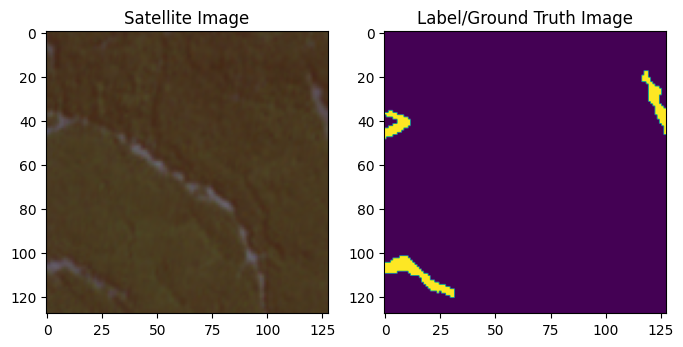

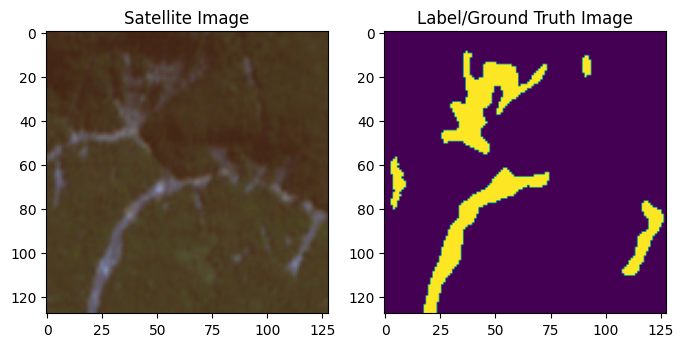

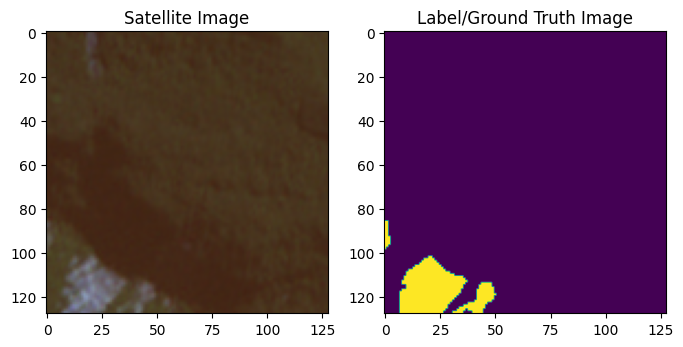

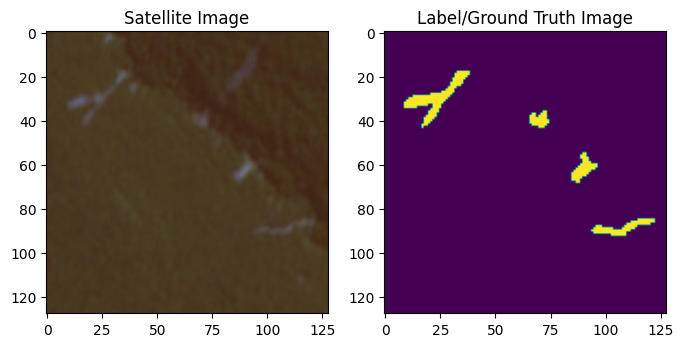

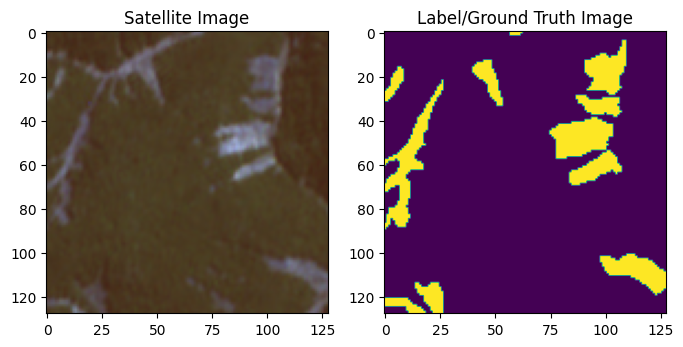

In [5]:
# Visualise some data
for i in range(5):
    f, axarr = plt.subplots(1,2,figsize=(8,8))
    axarr[0].imshow(X_train[i][:,:,:3])
    axarr[0].set_title("Satellite Image")
    axarr[1].imshow(np.squeeze(Y_train[i]))
    axarr[1].set_title("Label/Ground Truth Image")

# **INITIALIZE MODEL TRAINING PARAMETERS**

#### **Precision** is a measure of how many of the positive predictions made are correct (true positives).

#### **Recall** is a measure of how many of the positive cases the model correctly predicted, over all the positive cases in the data. It is sometimes also referred to as Sensitivity.

#### **F1-Score** is a measure combining both precision and recall. It is generally described as the harmonic mean of the two. Harmonic mean is just another way to calculate an “average” of values, generally described as more suitable for ratios (such as precision and recall) than the traditional arithmetic mean. The formula used for F1-score in this case is:

In [5]:
# Here we define the evaluation metrics - Precision, Recall, FScore, IoU
metrics = [sm.metrics.Precision(threshold=0.5),sm.metrics.Recall(threshold=0.5),sm.metrics.FScore(threshold=0.5,beta=1),['accuracy']]

#**WHAT IS A LOSS FUNCTION??**

A loss function is a function that compares the target and predicted output values; measures how well the neural network models the training data. When training, we aim to minimize this loss between the predicted and target outputs.

Dice Loss is widely used in image segmentation tasks to address the data imbalance problem.

![image](http://mriquestions.com/uploads/3/4/5/7/34572113/steepest-descent-loss-funciton_orig.png)

In [ ]:
!pip install tensorflow

In [6]:
# Loss function
import tensorflow.python.keras.backend as K

smooth = 1

def dsc(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return score

def dice_loss(y_true, y_pred):
    loss =  0.5 * tf.keras.losses.binary_crossentropy(y_true, y_pred) - dsc(y_true, y_pred)
    return loss

# **U-Net Segmentation Model**

Here we initialise the U-Net model for training purposes with the data we introduced above.

![unet](https://drive.google.com/uc?exportview=&id=1u8Bh1OKRy9FnC606-ZqhrQyKe5tdlV7a)

In [7]:
# Model training - Results are saved in a .csv file

# Size of the tiles/patches
size = X_train.shape[2] # This line takes the value of the 3rd index which in this is taken from X_train shape = 1119, 128, 128, 4, that is 128.

# Image bands
img_bands = X_train.shape[3] # This line takes the value of the 4th index which in this is taken from X_train shape = 1119, 128, 128, 4, that is 4.

# Loss function. We assign the variable called "loss" which takes the dice_loss loss function.
loss=dice_loss

# Number of filters. We set a range of the number of filters for the convolutional layers.
filters = [32,64]

In [8]:
def unet_plus_plus_model(filtersFirstLayer, lr, input_size = (size,size,img_bands)):
    
    inputs = Input(input_size)
    nb_filter = [32,64,128,256,512]
    s = Lambda(lambda x: x / 255) (inputs)


    c1 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (s)
    c1 = Dropout(0.5) (c1)
    c1 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c1)
    c1 = Dropout(0.5) (c1)
    p1 = MaxPooling2D((2, 2), strides=(2, 2)) (c1)

    c2 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p1)
    c2 = Dropout(0.5) (c2)
    c2 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c2)
    c2 = Dropout(0.5) (c2)
    p2 = MaxPooling2D((2, 2), strides=(2, 2)) (c2)

    up1_2 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up12', padding='same')(c2)
    conv1_2 = concatenate([up1_2, c1], name='merge12', axis=3)
    c3 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_2)
    c3 = Dropout(0.5) (c3)
    c3 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c3)
    c3 = Dropout(0.5) (c3)

    conv3_1 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p2)
    conv3_1 = Dropout(0.5) (conv3_1)
    conv3_1 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv3_1)
    conv3_1 = Dropout(0.5) (conv3_1)
    pool3 = MaxPooling2D((2, 2), strides=(2, 2), name='pool3')(conv3_1)

    up2_2 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up22', padding='same')(conv3_1)
    conv2_2 = concatenate([up2_2, c2], name='merge22', axis=3) #x10
    conv2_2 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_2)
    conv2_2 = Dropout(0.5) (conv2_2)
    conv2_2 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_2)
    conv2_2 = Dropout(0.5) (conv2_2)

    up1_3 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up13', padding='same')(conv2_2)
    conv1_3 = concatenate([up1_3, c1, c3], name='merge13', axis=3)
    conv1_3 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_3)
    conv1_3 = Dropout(0.5) (conv1_3)
    conv1_3 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_3)
    conv1_3 = Dropout(0.5) (conv1_3)

    conv4_1 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (pool3)
    conv4_1 = Dropout(0.5) (conv4_1)
    conv4_1 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv4_1)
    conv4_1 = Dropout(0.5) (conv4_1)
    pool4 = MaxPooling2D((2, 2), strides=(2, 2), name='pool4')(conv4_1)

    up3_2 = Conv2DTranspose(nb_filter[2], (2, 2), strides=(2, 2), name='up32', padding='same')(conv4_1)
    conv3_2 = concatenate([up3_2, conv3_1], name='merge32', axis=3) #x20
    conv3_2 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv3_2)
    conv3_2 = Dropout(0.5) (conv3_2)
    conv3_2 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv3_2)
    conv3_2 = Dropout(0.5) (conv3_2)

    up2_3 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up23', padding='same')(conv3_2)
    conv2_3 = concatenate([up2_3, c2, conv2_2], name='merge23', axis=3)
    conv2_3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_3)
    conv2_3 = Dropout(0.5) (conv2_3)
    conv2_3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_3)
    conv2_3 = Dropout(0.5) (conv2_3)

    up1_4 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up14', padding='same')(conv2_3)
    conv1_4 = concatenate([up1_4, c1, c3, conv1_3], name='merge14', axis=3)
    conv1_4 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_4)
    conv1_4 = Dropout(0.5) (conv1_4)
    conv1_4 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_4)
    conv1_4 = Dropout(0.5) (conv1_4)

    conv5_1 = Conv2D(512, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (pool4)
    conv5_1 = Dropout(0.5) (conv5_1)
    conv5_1 = Conv2D(512, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv5_1)
    conv5_1 = Dropout(0.5) (conv5_1)

    up4_2 = Conv2DTranspose(nb_filter[3], (2, 2), strides=(2, 2), name='up42', padding='same')(conv5_1)
    conv4_2 = concatenate([up4_2, conv4_1], name='merge42', axis=3) #x30
    conv4_2 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv4_2)
    conv4_2 = Dropout(0.5) (conv4_2)
    conv4_2 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv4_2)
    conv4_2 = Dropout(0.5) (conv4_2)

    up3_3 = Conv2DTranspose(nb_filter[2], (2, 2), strides=(2, 2), name='up33', padding='same')(conv4_2)
    conv3_3 = concatenate([up3_3, conv3_1, conv3_2], name='merge33', axis=3)
    conv3_3 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv3_3)
    conv3_3 = Dropout(0.5) (conv3_3)
    conv3_3 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv3_3)
    conv3_3 = Dropout(0.5) (conv3_3)

    up2_4 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up24', padding='same')(conv3_3)
    conv2_4 = concatenate([up2_4, c2, conv2_2, conv2_3], name='merge24', axis=3)
    conv2_4 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_4)
    conv2_4 = Dropout(0.5) (conv2_4)
    conv2_4 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_4)
    conv2_4 = Dropout(0.5) (conv2_4)

    up1_5 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up15', padding='same')(conv2_4)
    conv1_5 = concatenate([up1_5, c1, c3, conv1_3, conv1_4], name='merge15', axis=3)
    conv1_5 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_5)
    conv1_5 = Dropout(0.5) (conv1_5)
    conv1_5 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_5)
    conv1_5 = Dropout(0.5) (conv1_5)

    nestnet_output_4 = Conv2D(1, (1, 1), activation='sigmoid', kernel_initializer = 'he_normal',  name='output_4', padding='same')(conv1_5)

    model = Model([inputs], [nestnet_output_4])

    
    model.compile(optimizer = Adam(learning_rate = lr), loss = loss, metrics = metrics)
 
    # Returning the model
    return model
 

_______________________________________________________________________________
Filters:  32
Learning rate:  0.0005
Batch size:  32
Epoch 1/200


2024-04-29 17:49:04.200003: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
I0000 00:00:1714412958.220256     146 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


27/27 [==============================] - 78s 1s/step - loss: 0.0165 - precision: 0.3101 - recall: 0.3106 - f1-score: 0.2532 - accuracy: 0.8155 - val_loss: 0.0782 - val_precision: 0.2887 - val_recall: 0.1601 - val_f1-score: 0.1673 - val_accuracy: 0.8789
Epoch 2/200
27/27 [==============================] - 16s 606ms/step - loss: -0.3040 - precision: 0.5916 - recall: 0.5293 - f1-score: 0.5273 - accuracy: 0.9097 - val_loss: 0.0116 - val_precision: 0.4021 - val_recall: 0.2189 - val_f1-score: 0.2583 - val_accuracy: 0.8884
Epoch 3/200
27/27 [==============================] - 16s 604ms/step - loss: -0.4233 - precision: 0.6268 - recall: 0.6137 - f1-score: 0.6050 - accuracy: 0.9221 - val_loss: -0.1234 - val_precision: 0.4458 - val_recall: 0.2597 - val_f1-score: 0.3085 - val_accuracy: 0.8930
Epoch 4/200
27/27 [==============================] - 16s 594ms/step - loss: -0.4158 - precision: 0.6328 - recall: 0.6291 - f1-score: 0.6093 - accuracy: 0.9183 - val_loss: -0.2753 - val_precision: 0.4899 - val

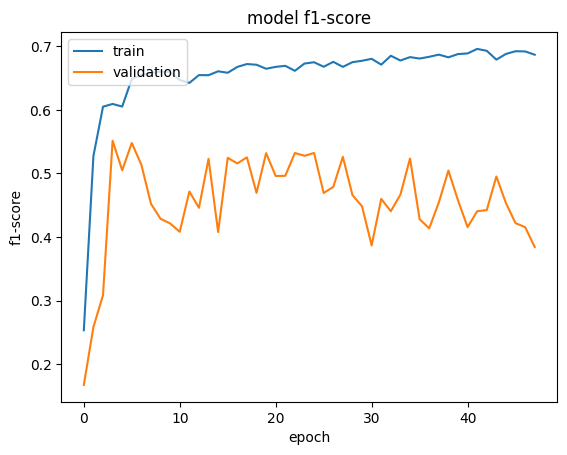

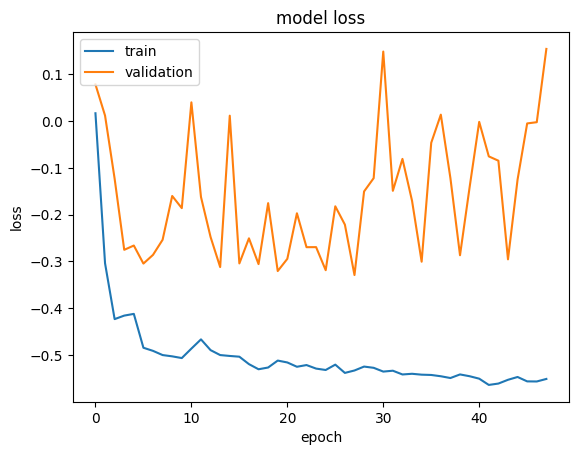

12/12 [==============================] - 5s 364ms/step - loss: -0.4317 - precision: 0.6486 - recall: 0.6044 - f1-score: 0.5861 - accuracy: 0.9163
_______________________________________________________________________________
Filters:  32
Learning rate:  0.0005
Batch size:  64
Epoch 1/200


2024-04-29 18:02:57.498044: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_2/dropout_60/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


14/14 [==============================] - 71s 1s/step - loss: 0.0311 - precision: 0.3104 - recall: 0.3068 - f1-score: 0.2405 - accuracy: 0.7777 - val_loss: 0.5107 - val_precision: 0.2038 - val_recall: 0.9166 - val_f1-score: 0.3234 - val_accuracy: 0.6669
Epoch 2/200
14/14 [==============================] - 16s 1s/step - loss: -0.2043 - precision: 0.5209 - recall: 0.4666 - f1-score: 0.4465 - accuracy: 0.8927 - val_loss: -0.0026 - val_precision: 0.4126 - val_recall: 0.3732 - val_f1-score: 0.3810 - val_accuracy: 0.8896
Epoch 3/200
14/14 [==============================] - 16s 1s/step - loss: -0.3735 - precision: 0.5928 - recall: 0.6145 - f1-score: 0.5976 - accuracy: 0.9155 - val_loss: -0.2296 - val_precision: 0.4634 - val_recall: 0.5387 - val_f1-score: 0.4936 - val_accuracy: 0.8984
Epoch 4/200
14/14 [==============================] - 16s 1s/step - loss: -0.4362 - precision: 0.6215 - recall: 0.6384 - f1-score: 0.6206 - accuracy: 0.9209 - val_loss: -0.1957 - val_precision: 0.3535 - val_recall:

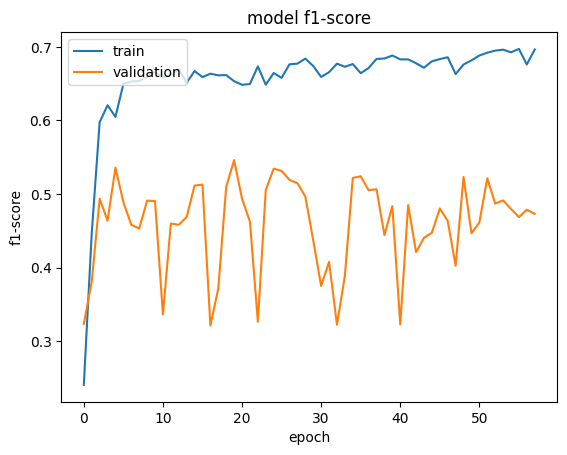

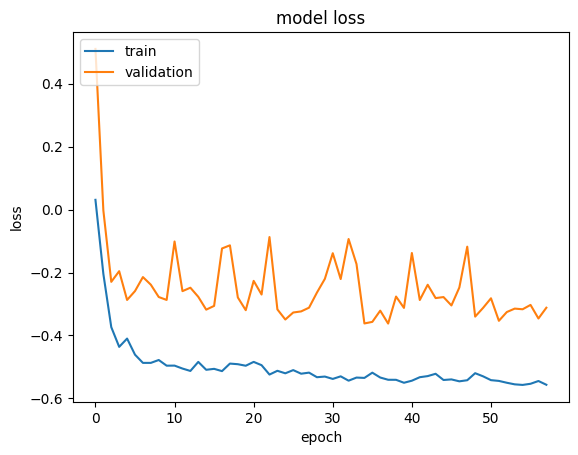

12/12 [==============================] - 3s 124ms/step - loss: -0.4697 - precision: 0.6340 - recall: 0.6481 - f1-score: 0.6018 - accuracy: 0.9173
_______________________________________________________________________________
Filters:  64
Learning rate:  0.0005
Batch size:  32
Epoch 1/200


2024-04-29 18:19:08.324866: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_4/dropout_120/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


27/27 [==============================] - 29s 629ms/step - loss: 0.0035 - precision: 0.3573 - recall: 0.2791 - f1-score: 0.2540 - accuracy: 0.8335 - val_loss: -0.0654 - val_precision: 0.2789 - val_recall: 0.1296 - val_f1-score: 0.1500 - val_accuracy: 0.8821
Epoch 2/200
27/27 [==============================] - 17s 619ms/step - loss: -0.2650 - precision: 0.5411 - recall: 0.5199 - f1-score: 0.5203 - accuracy: 0.9028 - val_loss: -0.1186 - val_precision: 0.4705 - val_recall: 0.3234 - val_f1-score: 0.3516 - val_accuracy: 0.8928
Epoch 3/200
27/27 [==============================] - 16s 603ms/step - loss: -0.3724 - precision: 0.6178 - recall: 0.5935 - f1-score: 0.5858 - accuracy: 0.9165 - val_loss: -0.2330 - val_precision: 0.4749 - val_recall: 0.6560 - val_f1-score: 0.5184 - val_accuracy: 0.8871
Epoch 4/200
27/27 [==============================] - 16s 585ms/step - loss: -0.4357 - precision: 0.6168 - recall: 0.6485 - f1-score: 0.6233 - accuracy: 0.9217 - val_loss: -0.0299 - val_precision: 0.3463 

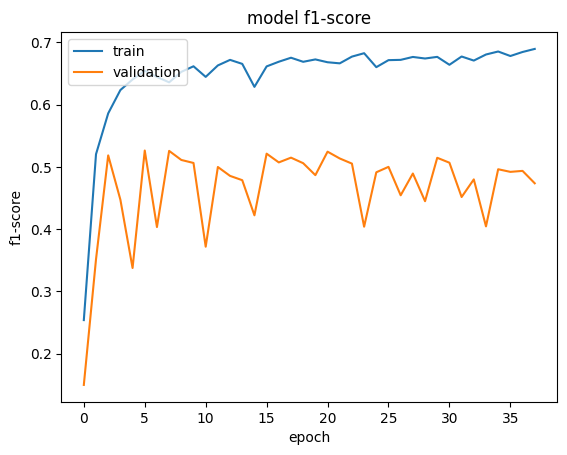

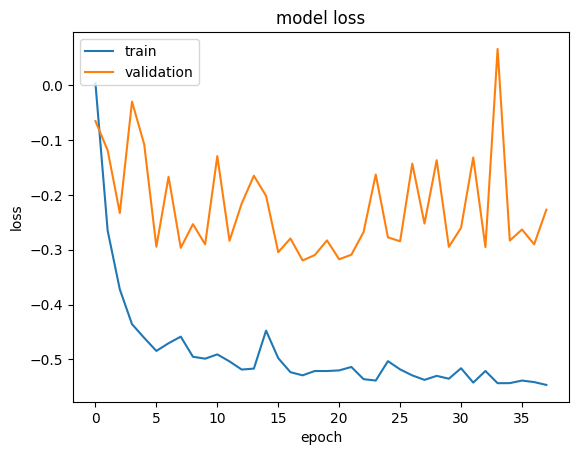

12/12 [==============================] - 3s 125ms/step - loss: -0.4390 - precision: 0.6493 - recall: 0.6142 - f1-score: 0.5891 - accuracy: 0.9169
_______________________________________________________________________________
Filters:  64
Learning rate:  0.0005
Batch size:  64
Epoch 1/200


2024-04-29 18:29:32.351771: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_6/dropout_180/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


14/14 [==============================] - 28s 1s/step - loss: 0.1098 - precision: 0.1858 - recall: 0.2189 - f1-score: 0.1472 - accuracy: 0.7684 - val_loss: 0.1746 - val_precision: 0.1760 - val_recall: 0.0533 - val_f1-score: 0.0806 - val_accuracy: 0.8770
Epoch 2/200
14/14 [==============================] - 16s 1s/step - loss: -0.0111 - precision: 0.4306 - recall: 0.2187 - f1-score: 0.2378 - accuracy: 0.8792 - val_loss: -0.0087 - val_precision: 0.1639 - val_recall: 0.1116 - val_f1-score: 0.1289 - val_accuracy: 0.8805
Epoch 3/200
14/14 [==============================] - 16s 1s/step - loss: -0.1565 - precision: 0.4546 - recall: 0.4142 - f1-score: 0.4180 - accuracy: 0.8893 - val_loss: 0.0021 - val_precision: 0.3709 - val_recall: 0.3194 - val_f1-score: 0.3287 - val_accuracy: 0.8855
Epoch 4/200
14/14 [==============================] - 16s 1s/step - loss: -0.3297 - precision: 0.5569 - recall: 0.5468 - f1-score: 0.5465 - accuracy: 0.9106 - val_loss: 0.0456 - val_precision: 0.3861 - val_recall: 0

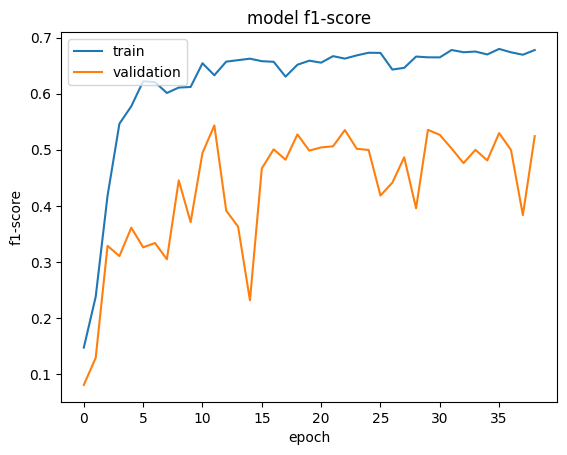

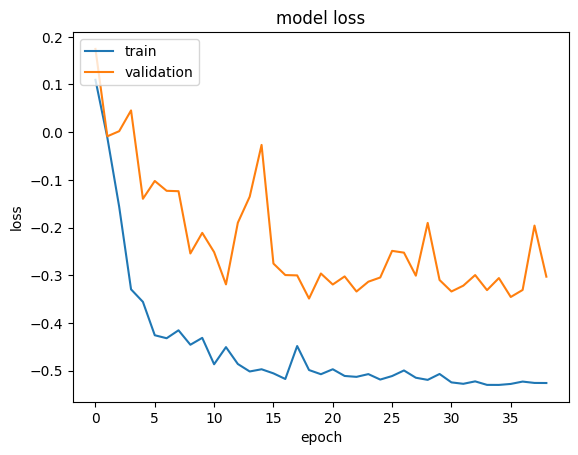

12/12 [==============================] - 3s 125ms/step - loss: -0.4440 - precision: 0.6455 - recall: 0.6216 - f1-score: 0.6046 - accuracy: 0.9170


In [10]:
# The learning rate is a tuning parameter in an optimization algorithm that determines the step size
# at each iteration while moving toward a minimum of a loss function.
# Learning rates for the ADAM optimizer that we use in the model. An activation function decides whether a neuron should be activated or not.
# This means that it will decide whether the neuron's input to the network is important or not in the process of prediction using simpler mathematical operations.
# Optimizers helps in maintaining a steady learning capability of the model while also keeping the loss at the minimum.
lr = [0.0005]

# Batch sizes. This considers how many patches the model will take during the training phases. A value of 4 means 4 patches of images (from 1119) will be taken as a batch while training simultaneously.
batch_size = [32,64]

# Epochs. The number of iterations the model will train.
epochs = 200

# Dictionary that will save the results. We first make an empty dictionary so that later we can save/store all the important configurations that we experimented with and report at the end in nice Excel CSVs and Plots.
dic = {}

# Hyperparameters. These are the keys where the associated information for each hyperparameter will be saved.
dic["model"] = [] # Name of the model
dic["batch_size"] = [] # Batch Size
dic["learning_rate"] = [] # Learning rate
dic["filters"] = [] # Number of filters

# Metrics on the test set. It will save the metrics after evaluating the model on the test set.
dic["precision_area"] = []
dic["recall_area"] = []
dic["f1_score_area"] = []

## Here we perform a nested for-loop to check all possible hyperparameter combinations that we set above.

# loop over all the filters in the filter list
for fiilter in filters:
    # loop over the learning rates
    for learning_rate in lr:
        # loop over all batch sizes in batch_size list
        for batch in batch_size:
            print('_______________________________________________________________________________')
            print('Filters: ', fiilter)
            print('Learning rate: ', learning_rate)
            print('Batch size: ', batch)
            
            #if(os.path.isfile(f'/kaggle/working/weights/UnetPlus_size_{size}_filters_{fiilter}_batch_size_{batch}_lr_{learning_rate}.hdf5')):
                #continue

            model = unet_plus_plus_model(filtersFirstLayer= fiilter, lr = learning_rate, input_size = (size,size,img_bands))
            

            # Stop the training if the validation loss does not decrease after 30 epochs. This is done to avoid over-fitting of the model. Please find the materials to understand overfitting here: https://www.v7labs.com/blog/overfitting
            early_stop = keras.callbacks.EarlyStopping(monitor = 'val_loss', # what is the metric to measure. We choose "val_loss" because we want to monitor the progress of the model while tuning on the validation data set.
                              patience = 20, # how many epochs to continue running the model after not seeing any change in the "val_loss"
                              restore_best_weights = True) # update the model weights

            # Save the models only when validation loss decrease
            model_checkpoint = tf.keras.callbacks.ModelCheckpoint(f'../weights/UnetPlus_size_{size}_filters_{fiilter}_batch_size_{batch}_lr_{learning_rate}.hdf5',
                                                                  monitor='val_loss', mode='min',verbose=0, save_best_only=True,save_weights_only = True)

            # fit the model with 20% of the dataset used as the validation set
            history = model.fit(X_train,Y_train,
                                batch_size = batch,epochs=epochs,
                                validation_split=0.25, # This is the value that sets the validation split from the training data (X_train)
                                callbacks = [model_checkpoint, early_stop], verbose=1)

            # summarize history for f1-score - we want this to increase....
            plt.plot(history.history['f1-score'])
            plt.plot(history.history['val_f1-score'])
            plt.title('model f1-score')
            plt.ylabel('f1-score')
            plt.xlabel('epoch')
            plt.legend(['train', 'validation'], loc='upper left')
            # save plots locally
            plt.savefig(f"../plots/UnetPlus_size_{size}_filters_{fiilter}_batch_size_{batch}_lr_{learning_rate}_f1_score.png")
            plt.show()
            # summarize history for loss - we want this to decrease....
            plt.plot(history.history['loss'])
            plt.plot(history.history['val_loss'])
            plt.title('model loss')
            plt.ylabel('loss')
            plt.xlabel('epoch')
            plt.legend(['train', 'validation'], loc='upper left')
            plt.savefig(f"../plots/UnetPlus_size_{size}_filters_{fiilter}_batch_size_{batch}_lr_{learning_rate}_val_loss.png")
            plt.show()

            # load unet to evaluate the test data
            load_unet = unet_plus_plus_model(filtersFirstLayer= fiilter, lr = learning_rate, input_size = (size,size,img_bands))
            # load the last saved weight from the training
            load_unet.load_weights(f"../weights/UnetPlus_size_{size}_filters_{fiilter}_batch_size_{batch}_lr_{learning_rate}.hdf5")

           # Here, we evaluate the model performance on the test set, a set of data that the model has never seen before and therefore remains an objective tool to test the performance of the model.
            res_1= load_unet.evaluate(X_test,Y_test)

            # save results on the dictionary and then output them all in a Excel CSV file.
            dic["model"].append("Unet")
            dic["batch_size"].append(batch)
            dic["learning_rate"].append(learning_rate)
            dic["filters"].append(fiilter)
            dic["precision_area"].append(res_1[1])
            dic["recall_area"].append(res_1[2])
            dic["f1_score_area"].append(res_1[3])

            # Convert results to a dataframe
            results = pd.DataFrame(dic)
            # Export as csv
            results.to_csv(f'../results_UnetPlus.csv', index = False)

# **PREDICT LANDSLIDES ON THE TEST SET**

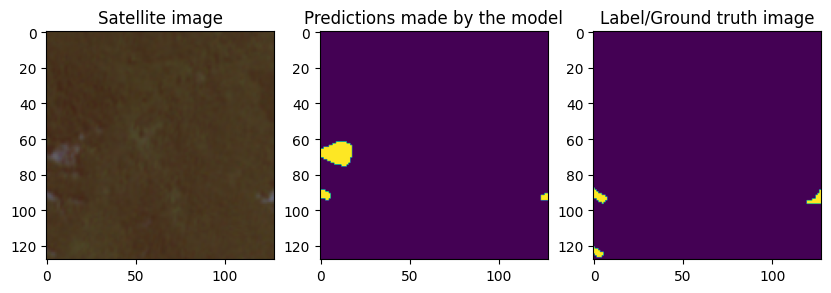

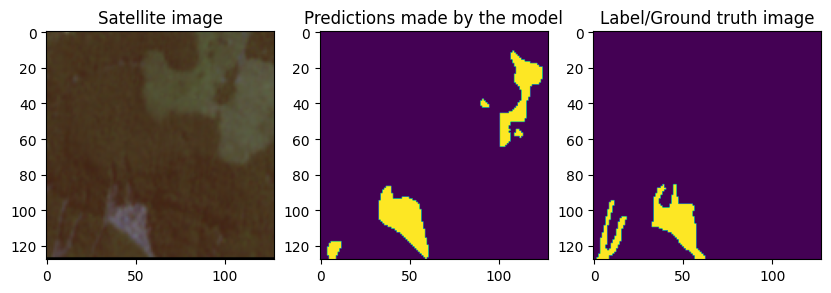

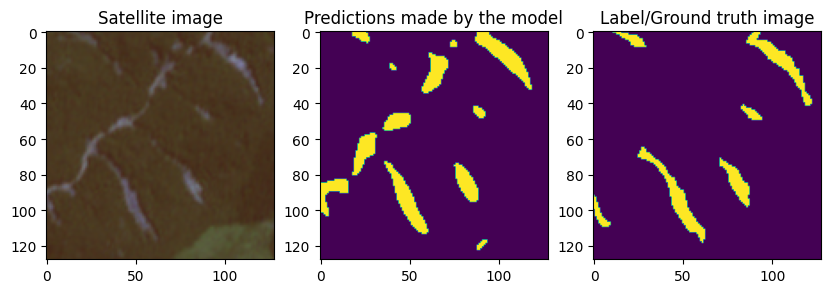

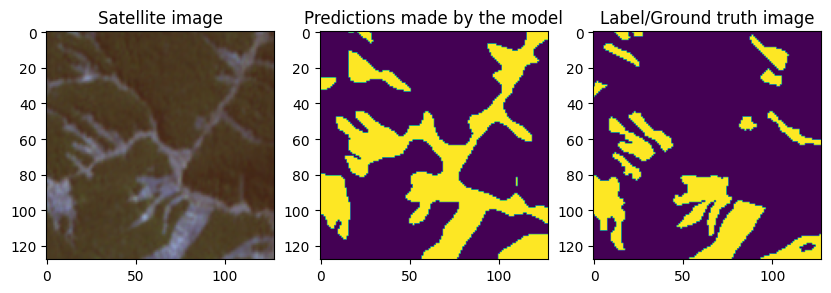

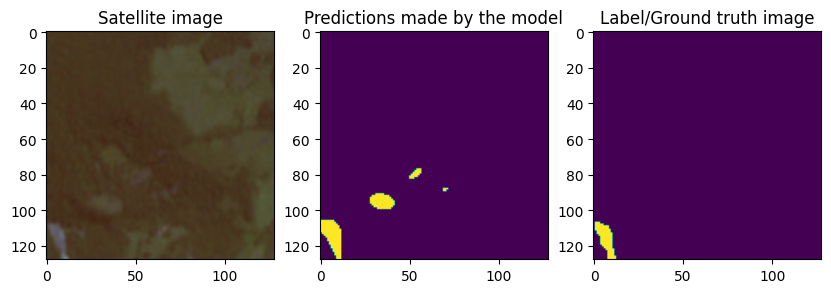

...

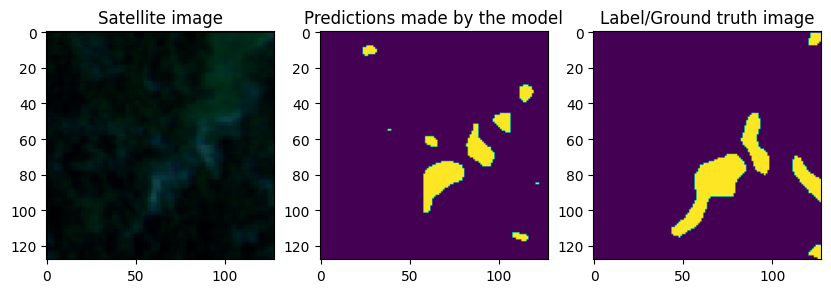

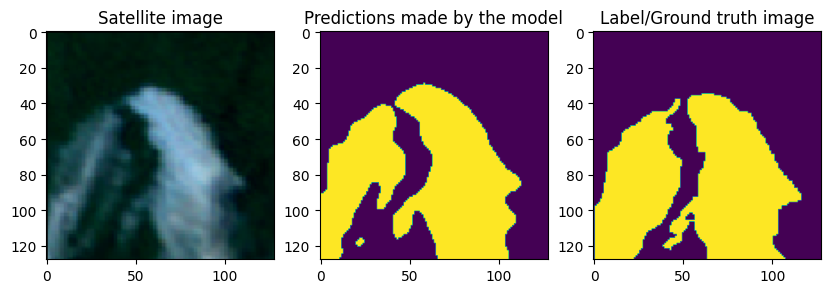

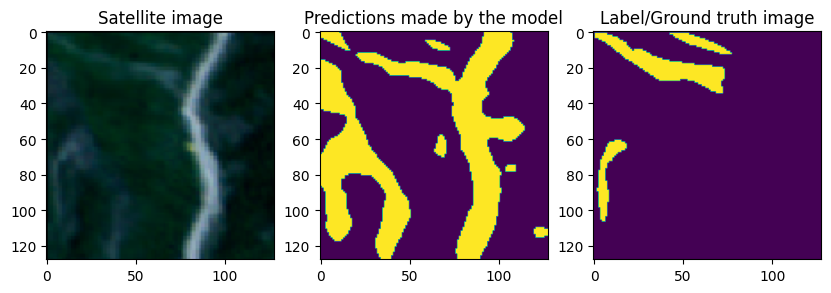

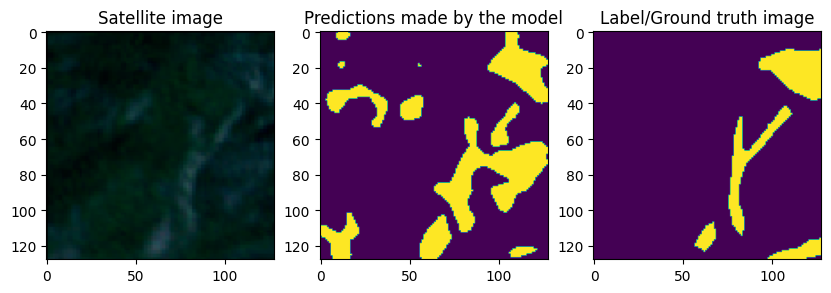

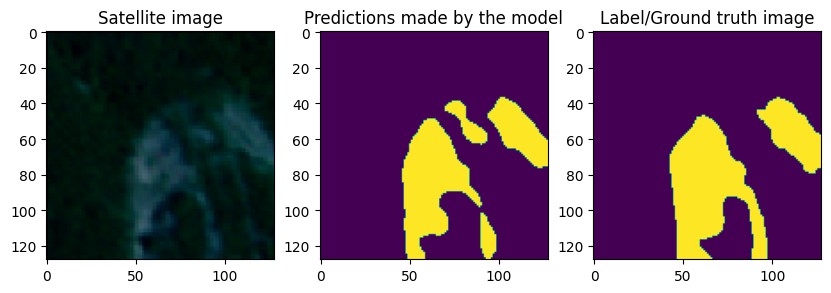

In [9]:
# Load the best model based on the best performances on the test set (check CSV file)
# Loading the model weights
unet_best = unet_plus_plus_model(filtersFirstLayer= 32,lr = 0.001,input_size=(size,size,img_bands)) # We need to the same number of filters and learning rate of the chosen model to initialise the network.
unet_best.load_weights("../weights/UnetPlus_size_128_filters_32_batch_size_32_lr_0.001.hdf5")

no = 20#X_test.shape[0]
# Plot predictions on test set
for i in range(no):
    preds_train_1 = unet_best.predict(np.expand_dims(X_test[i],axis = 0), verbose=0)
    # It's possible to change the 0.5 threshold to improve the results;
    preds_train_t1 = (preds_train_1 > 0.5).astype(np.uint8)
    f, axarr = plt.subplots(1,3,figsize=(10,10))
    axarr[0].imshow(X_test[i][:,:,:3])
    axarr[0].set_title("Satellite image")
    axarr[1].imshow(np.squeeze(preds_train_t1))
    axarr[1].set_title("Predictions made by the model")
    axarr[2].imshow(np.squeeze(Y_test[i]))
    axarr[2].set_title("Label/Ground truth image")

# Inferencing on the Haiti co-seismic landslides of 2021

#### Now, since we have a trained model which can very well distinguish between landslide and non-landslide areas after training on this nicely curated dataset, the point is to see if this model can now predict new landslide occurrences in events that occurred recently. In real-case scenarios, we would ideally like to get the landslide "footprints" as accurately and fast as possible for a number of reasons spanning from
1. relief protocols;
2. assessisng damage to elements-at-risk;
3. using the predictions for further predictive modelling, for example, susceptibility or even hazard assessment.

Some useful links:
1. https://pubs.er.usgs.gov/publication/ofr20211112

In [11]:
import rasterio
# Set the required settings
patchsize=128
overlap=24
nbands=4

# Image that you use to predict on (Haiti)
image_data = rasterio.open("../Data/Inference/haiti.tif")
#image_data = rasterio.open("/kaggle/working/nepalNew/Nepal_2015.tif")
bands = [image_data.read(i+1) for i in range(nbands)]
Xuse = np.stack(bands,axis=2)
NROWS, NCOLS, NBANDS = Xuse.shape
Xuse = np.expand_dims(Xuse, axis=0)
print(f'Shape of the satellite image{Xuse.shape}')

Shape of the satellite image(1, 1518, 1980, 4)


## This code will run the predictions on the entire Haiti image using the best model that we got.



In [12]:
# Initiate the code with even number divisibility
_,Nrows,Ncols,NBands=Xuse.shape
if Ncols%patchsize!=0 or Nrows%patchsize!=0:
    print("The shape of input image is not divisible by patch size removing last pixels")
    newrow=int(Nrows/patchsize)
    newcol=int(Ncols/patchsize)
    Xuse=Xuse[:,:newrow*patchsize,:newcol*patchsize,:]
    print(f"the shape of new image is {Xuse.shape}")

# Overlapping
_,Nrows,Ncols,NBands=Xuse.shape
itrcol=int((Ncols-patchsize)/(patchsize-overlap))+1
itrrow=int((Nrows-patchsize)/(patchsize-overlap))+1
totalmap=np.zeros((Nrows,Ncols),dtype=np.float32)
halfoverlap=int((overlap/2))
# print(itrcol,itrrow)
for i in range(itrrow):
    if i ==0:
        striptop=i
        stripbottom=patchsize
        #print(striptop,stripbottom)
    else:
        striptop=(patchsize-overlap)*i
        stripbottom=(patchsize-overlap)*i+patchsize
    for j in range(itrcol):
        if j==0:
            stripleft=j
            stripright=patchsize
        else:
          # Prediction
            stripleft=(patchsize-overlap)*j
            stripright=(patchsize-overlap)*j+patchsize
        Xuse_sub=Xuse[:,striptop:stripbottom,stripleft:stripright,:]
        predictions=unet_best.predict_on_batch(Xuse_sub)
        #predictions = (predictions > 0.9).astype(int)
        # predictions = (predictions[3] > 0.9).astype(np.uint8)

        # Check the last layer of the array for the above description and change accordingly.
        # print(f'Shape of the image: {predictions.shape}')
        # print(np.unique(predictions))

        # Prediction using the overlaps
        if i==0:
            filltop=int(i)
            fillbottom=int((patchsize-overlap/2))
            if j==0:
                fillleft=int(j)
                fillright=int((patchsize-overlap/2))
                totalmap[filltop:fillbottom,fillleft:fillright]=np.squeeze(predictions[:,:-halfoverlap,:-halfoverlap,:][0],axis=2)
            else:
                fillleft=int((patchsize-overlap/2)+(patchsize-overlap)*(j-1))
                fillright=int((patchsize-overlap/2)+(patchsize-overlap)*j)
                totalmap[filltop:fillbottom,fillleft:fillright]=np.squeeze(predictions[:,:-halfoverlap,halfoverlap:-halfoverlap,:][0], axis=2)

            # print(np.unique(totalmap))
            # break
        else:
            filltop=int((patchsize-overlap/2)+(patchsize-overlap)*(i-1))
            fillbottom=int((patchsize-overlap/2)+(patchsize-overlap)*i)
            if j==0:
                fillleft=int(j)
                fillright=int((patchsize-overlap/2))
                totalmap[filltop:fillbottom,fillleft:fillright]=np.squeeze(predictions[:,halfoverlap:-halfoverlap,:-halfoverlap,:][0], axis=2)
            else:
                fillleft=int((patchsize-overlap/2)+(patchsize-overlap)*(j-1))
                fillright=int((patchsize-overlap/2)+(patchsize-overlap)*j)
                totalmap[filltop:fillbottom,fillleft:fillright]=np.squeeze(predictions[:,halfoverlap:-halfoverlap,halfoverlap:-halfoverlap,:][0], axis=2)

The shape of input image is not divisible by patch size removing last pixels
the shape of new image is (1, 1408, 1920, 4)


### This section converts the predictions to a .TIFF image and an ESRI shapefile which you can use to view in a GIS platform like QGIS or ArcMap/Pro.

In [13]:
# Convert from float to integer
intmap = np.rint(totalmap)
predictions=intmap

save_file="../predictions/haiti.tif" ##Give the save name to save predicted data in here
#save_file="/kaggle/working/nepalNew/Nepal_2015.tif"
with rasterio.Env():
    profile = image_data.profile
    profile.update(
        dtype=rasterio.int64,
        count=1,
        width= predictions.shape[-1],
        height= predictions.shape[-2],
        transform= image_data.transform*image_data.transform.scale(0.25,0.25),
        compress='lzw')
    with rasterio.open(save_file, 'w', **profile) as dst:
        dst.write(predictions.astype(rasterio.int8), 1)

In [14]:
import geopandas as gpd
from rasterio.features import shapes

mask=predictions==1
results = (
        {'properties': {'raster_val': v}, 'geometry': s}
        for i, (s, v)
        in enumerate(
            shapes(predictions, mask=mask, transform=image_data.transform)))

geoms = list(results)
gpd_polygonized_raster = gpd.GeoDataFrame.from_features(geoms)
gpd_polygonized_raster = gpd_polygonized_raster.set_crs(image_data.crs)

gpd_polygonized_raster.to_file("../predictions/haiti.shp")
print("Shapefile conversion successful !!!")

Shapefile conversion successful !!!


In [37]:
print(geoms)

[]


### Just to visualise the prediction alongside the satellite imagery

This is the satellite image of the affected region in Haiti


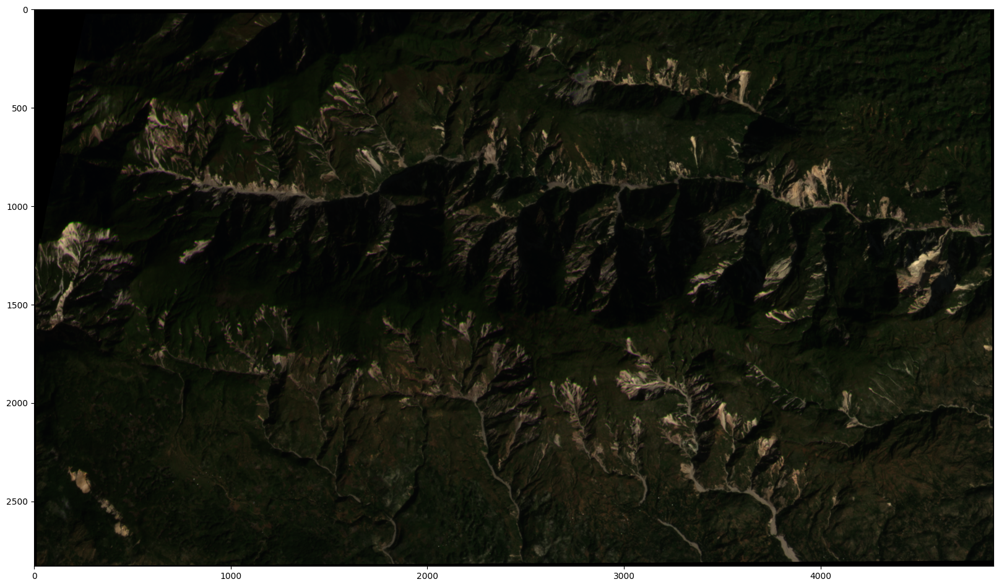

In [47]:
from matplotlib import pyplot as plt
import rasterio

print("This is the satellite image of the affected region in Haiti")
src = rasterio.open("../Data/Inference/haiti.tif")

# Read bands 1, 2, and 3
red = src.read(3)
green = src.read(2)
blue = src.read(1)

# Stack bands
rgb = np.stack((red, green, blue), axis=-1)

# Normalize bands into 0.0 - 1.0 scale
rgb_norm = (rgb - np.min(rgb)) / (np.max(rgb) - np.min(rgb))

fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(rgb_norm)
plt.show()


This is the satellite image of the affected region in Haiti


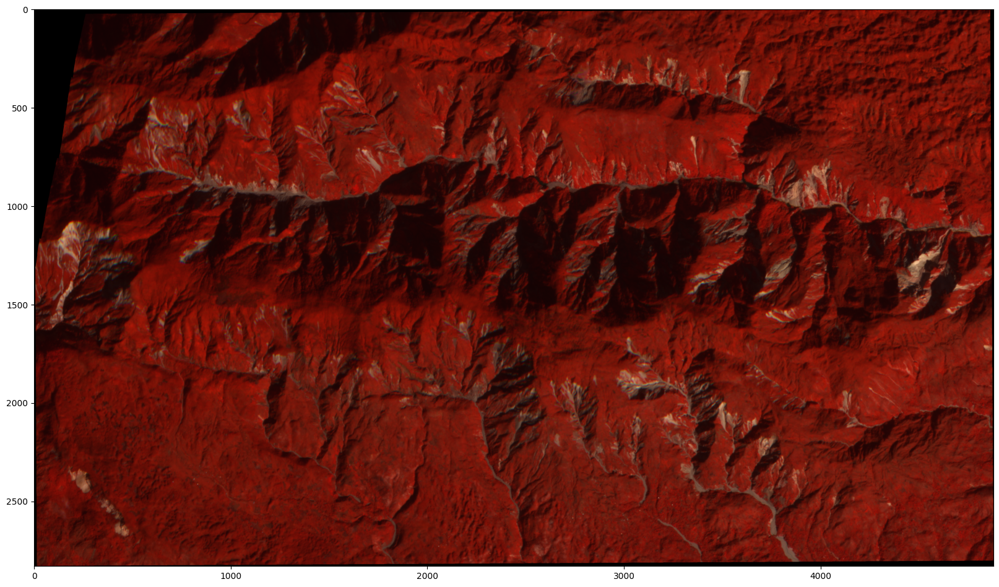

In [19]:
from matplotlib import pyplot as plt
import rasterio

print("This is the satellite image of the affected region in Haiti")
src = rasterio.open("../Data/Inference/haiti.tif")

# Read bands 4, 2, and 1
red = src.read(4)
green = src.read(2)
blue = src.read(1)

# Stack bands
rgb = np.stack((red, green, blue), axis=-1)

# Normalize bands into 0.0 - 1.0 scale
rgb_norm = (rgb - np.min(rgb)) / (np.max(rgb) - np.min(rgb))

fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(rgb_norm)
plt.show()


These are the predictions.......


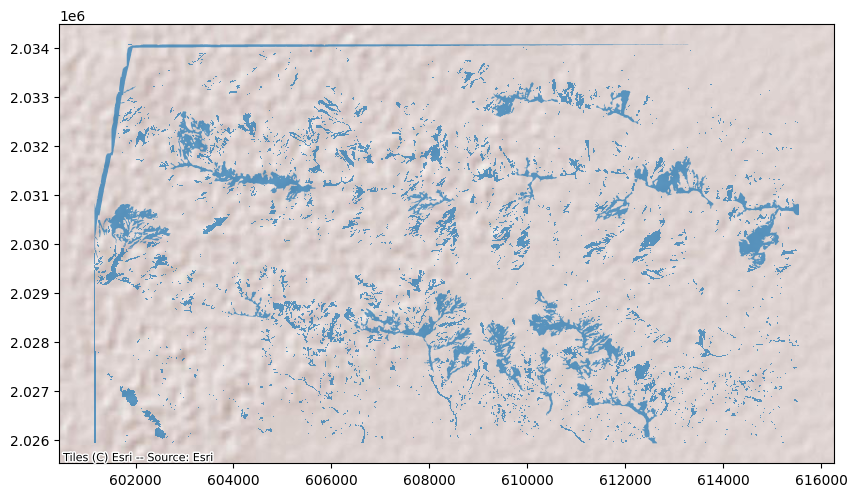

In [93]:
import contextily as cx
print("These are the predictions.......")
df = gpd.read_file("../predictions/haiti.shp")
df_wm = df.to_crs(epsg=32618)
ax=df_wm.plot(legend=True,figsize=(10, 10), alpha=0.7)
cx.add_basemap(ax,source=cx.providers.Esri.WorldShadedRelief)

This is the satellite image of the affected region in Haiti


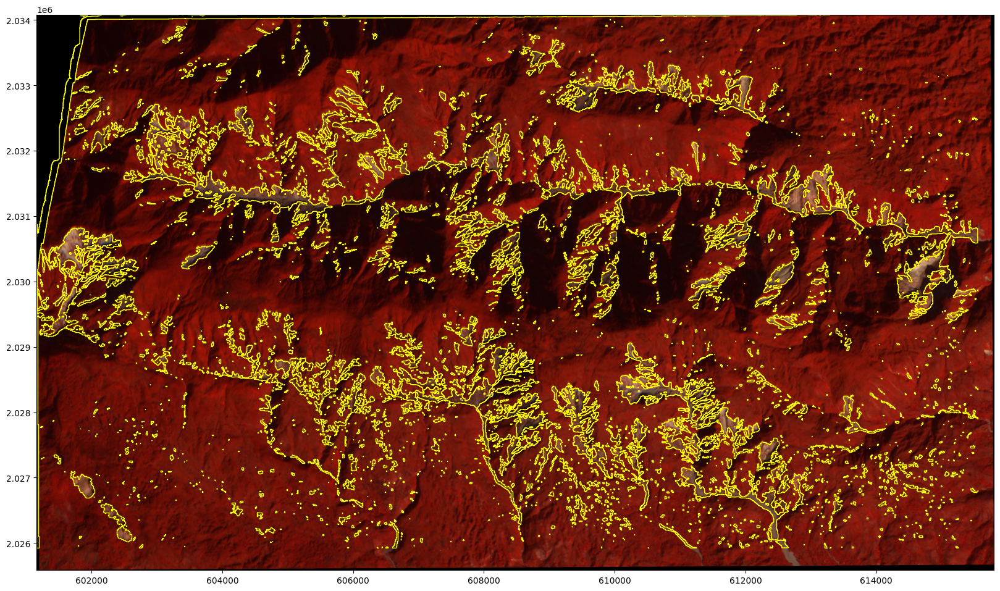

In [61]:
import geopandas as gpd
import rasterio
import numpy as np
import matplotlib.pyplot as plt

print("This is the satellite image of the affected region in Haiti")

# Open raster file
src = rasterio.open("../Data/Inference/haiti.tif")

# Read bands 4, 2, and 1
red = src.read(4)
green = src.read(2)
blue = src.read(1)

# Stack bands
rgb = np.stack((red, green, blue), axis=-1)

# Normalize bands into 0.0 - 1.0 scale
rgb_norm = (rgb - np.min(rgb)) / (np.max(rgb) - np.min(rgb))

fig, ax = plt.subplots(figsize=(20, 20))

# Display the image
ax.imshow(rgb_norm, extent=[src.bounds[0], src.bounds[2], src.bounds[1], src.bounds[3]])

# Open shapefile
df = gpd.read_file("../predictions/haiti.shp")

# Reproject the GeoDataFrame to match the raster data
df_wm = df.to_crs(src.crs)

# Plot the GeoDataFrame with white edges and transparent faces
df_wm.plot(ax=ax, edgecolor='yellow', facecolor='none')

plt.show()
